In [6]:
# coding=utf-8

import os
import torch
import random
import numpy as np
from tqdm import tqdm
from torchvision.utils import save_image
from transformers import CLIPTokenizer, CLIPTextModel
from diffusers import (
    AutoencoderKL,
    UNet2DConditionModel,
    ControlNetModel,
    DDPMScheduler,
)
from train_controlnet_my import DatasetRetina, DatasetCADIS  # reuse your dataset definition

from PIL import Image
import torch.nn.functional as F

# import lpips

import pandas as pd
import cv2

import matplotlib.pyplot as plt

from torch.utils.data import Dataset

# import torch_fidelity

# from torchmetrics.image.fid import FrechetInceptionDistance
# from torchmetrics.image.kid import KernelInceptionDistance
# from torchmetrics.image.lpip import LearnedPerceptualImagePatchSimilarity

# from cleanfid import fid

In [7]:
def load_results_to_array(path,  num_samples = 0 ):

    images_list_out = []


    images_list = sorted(os.listdir(path))

    if num_samples > 0:

        random.seed(10)
        indices = random.choices(range(len(images_list)), k=num_samples)
        images_list = [images_list[i] for i in indices]


    for image_name in images_list:

        image_path = os.path.join(path, image_name)

        image_pil = Image.open(image_path)
        image = np.asarray(image_pil)
        # print(image.shape)

        images_list_out.append(image)
    
    images_array_out = np.array(images_list_out)
    print(images_array_out.shape)



    return images_array_out     # [N, W, H, 3]

def load_sim_images_to_array(path,  num_samples = 0 ):

    images_list_out = []


    images_list = sorted(os.listdir(path))
    image_numbers = [x[-8:-4] for x in images_list]


    if num_samples > 0:

        random.seed(10)
        indices = random.choices(range(len(image_numbers)), k=num_samples)
        image_numbers = [image_numbers[i] for i in indices]


    for num in image_numbers:

        image_name = f"frame_{num}.png"
        image_path = os.path.join(path, image_name)

        image_pil = Image.open(image_path)
        image = np.asarray(image_pil)
        image = cv2.resize(image, (256, 256), interpolation=cv2.INTER_NEAREST)
        # print(image.shape)

        images_list_out.append(image)
    
    images_array_out = np.array(images_list_out)
    print(images_array_out.shape)



    return images_array_out     # [N, W, H, 3]


In [8]:
path = "records_cadis_1/diff_results/r3"
diff_results_set = load_results_to_array(path, num_samples = 0)

(70, 256, 256, 3)


In [9]:

path = "records_cadis_1/records_single_files/r3"
sim_images_set = load_sim_images_to_array(path, num_samples = 0)

(140, 256, 256, 3)


In [10]:
diff_results_set.shape

(70, 256, 256, 3)

In [11]:
def dataset_to_array(dataset, num_samples = 0 ):



    images_list_out = []

    if num_samples > 0:

        random.seed(10)
        indices = random.sample(range(len(dataset)), num_samples)
    else:
        indices = [i for i in range(len(dataset))]

    samples = [dataset[i] for i in indices]


    for idx, sample in enumerate(samples):
        image = sample["image"].numpy().transpose(1,2,0)
        # print(image.shape, image.dtype, np.min(image), np.max(image))

        if idx % 25 == 0:
            print(idx)

        images_list_out.append(image.astype(np.float32))

        # plt.imshow(image.astype(np.float32))
        # plt.show()

    images_array_out = np.array(images_list_out)
    # print(images_array_out.shape)


    return images_array_out # [N, W, H, 3]

dataset = DatasetRetina(image_size=256, augment = False, augmentation_factor=1, 
                            from_file=['/home/MichalMo/projects/ControlNet-diffusers/cataract_my_split_1/cataract_my_split_1_val.csv'])


gt_images_set  = dataset_to_array(dataset, num_samples = 0)
print(gt_images_set.shape)
# len(dataset)

(169, 4)
Loaded 169 samples, will virtually expand ×1 = 169
0
25
50
75
100
125
150
(169, 256, 256, 3)


(256, 256, 3) uint8


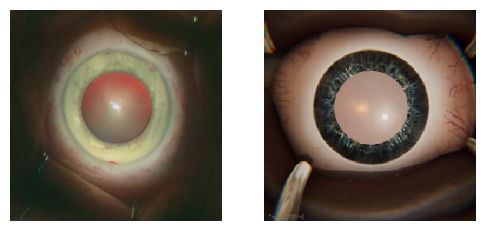

(256, 256, 3) uint8


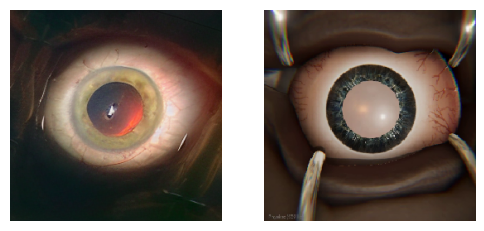

(256, 256, 3) uint8


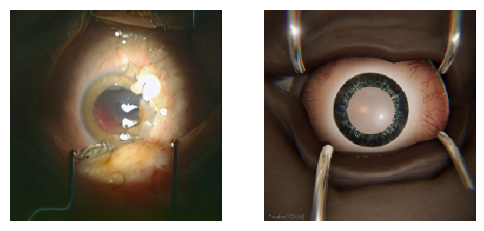

(256, 256, 3) uint8


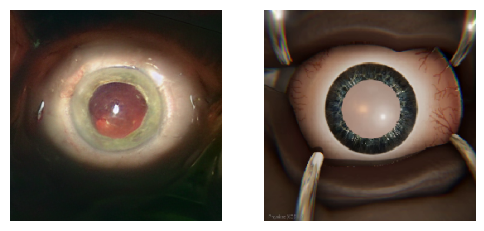

(256, 256, 3) uint8


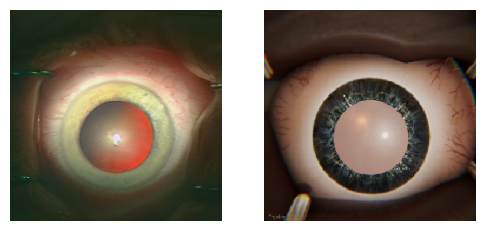

(256, 256, 3) uint8


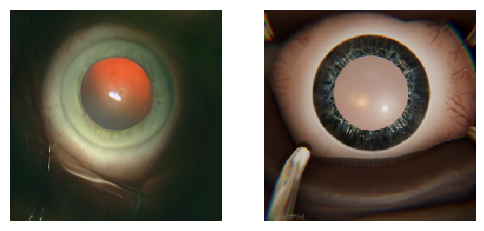

(256, 256, 3) uint8


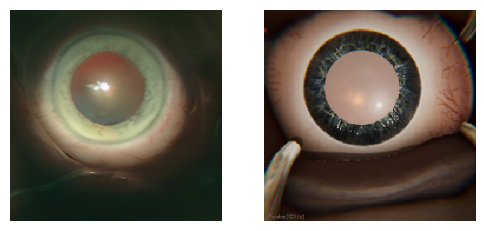

(256, 256, 3) uint8


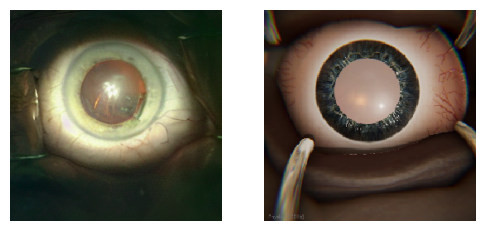

(256, 256, 3) uint8


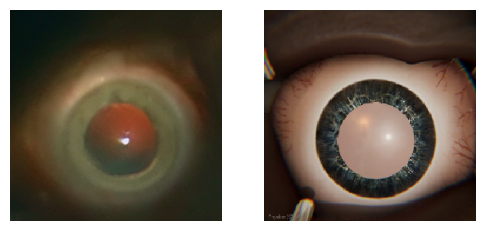

(256, 256, 3) uint8


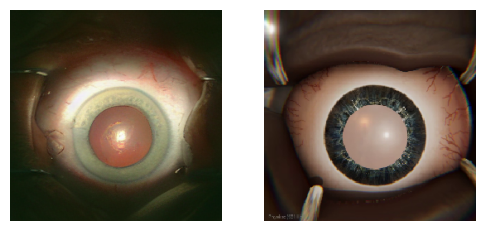

(256, 256, 3) uint8


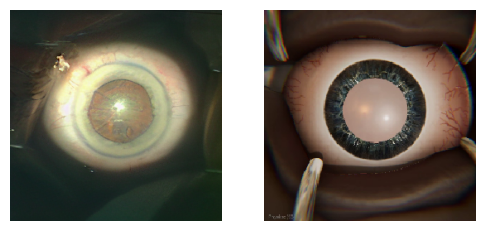

(256, 256, 3) uint8


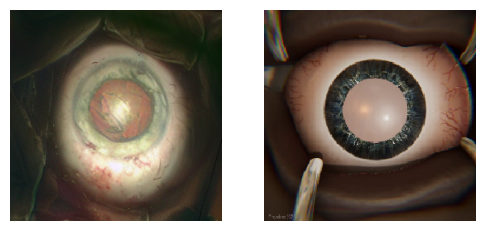

(256, 256, 3) uint8


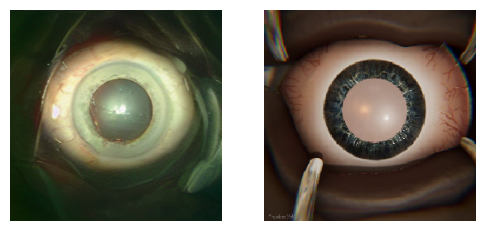

(256, 256, 3) uint8


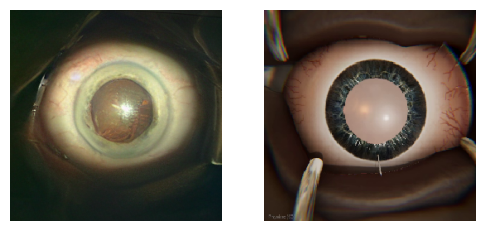

(256, 256, 3) uint8


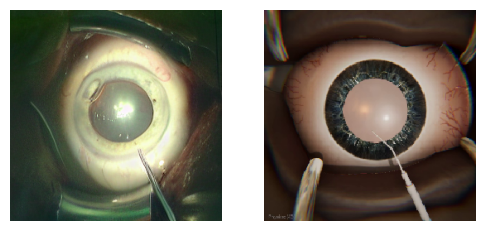

(256, 256, 3) uint8


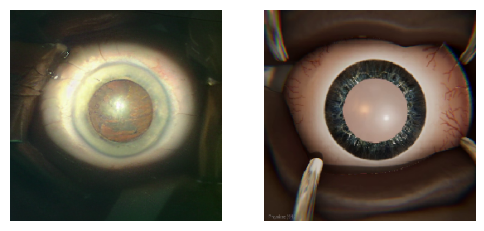

(256, 256, 3) uint8


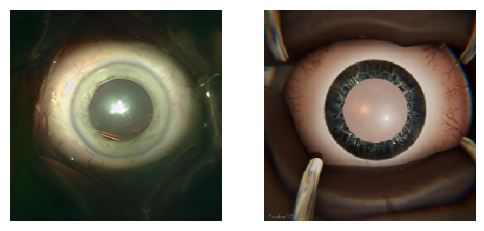

(256, 256, 3) uint8


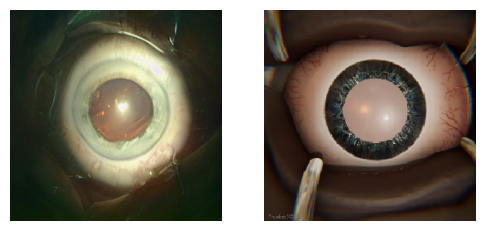

(256, 256, 3) uint8


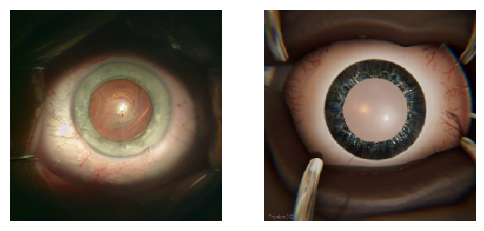

(256, 256, 3) uint8


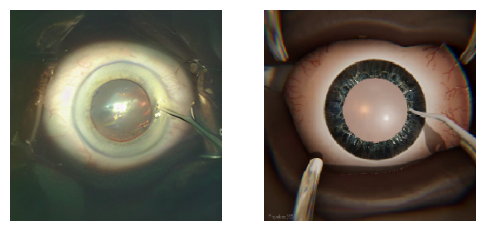

(256, 256, 3) uint8


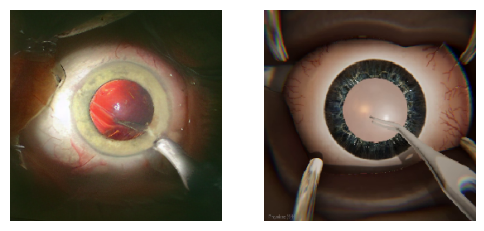

(256, 256, 3) uint8


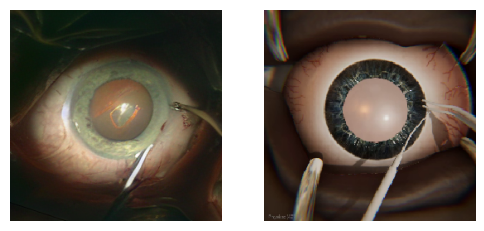

(256, 256, 3) uint8


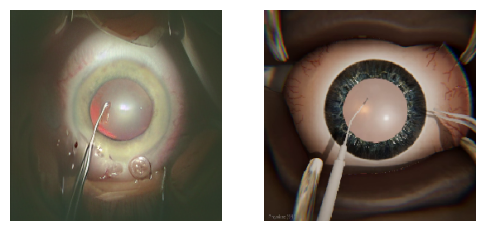

(256, 256, 3) uint8


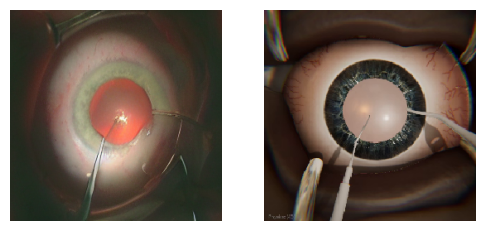

(256, 256, 3) uint8


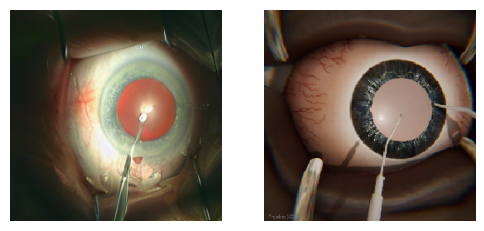

(256, 256, 3) uint8


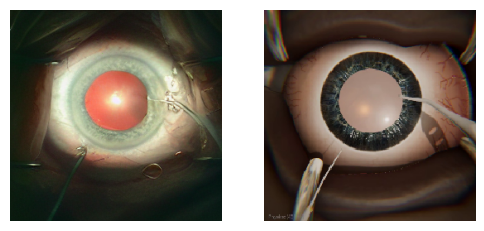

(256, 256, 3) uint8


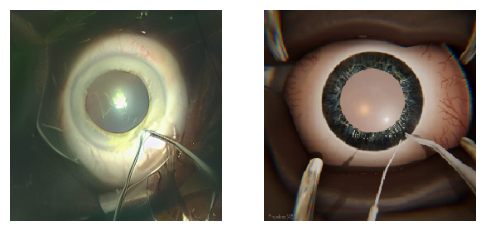

(256, 256, 3) uint8


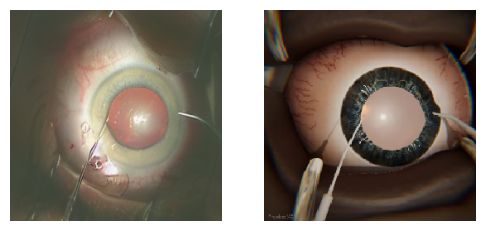

(256, 256, 3) uint8


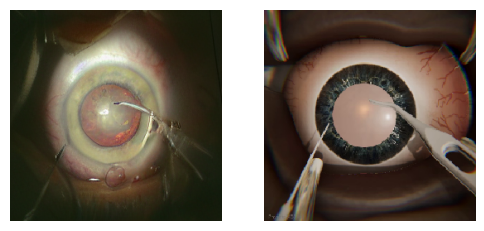

(256, 256, 3) uint8


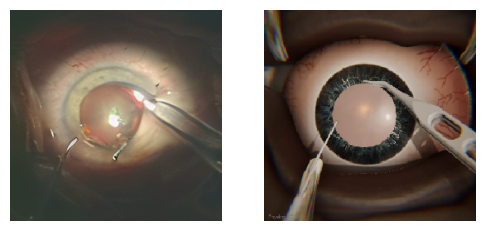

(256, 256, 3) uint8


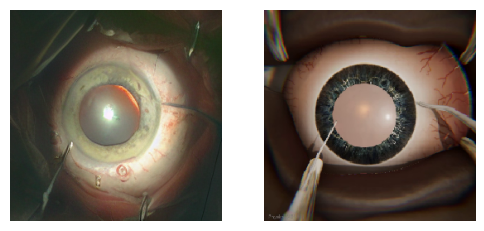

(256, 256, 3) uint8


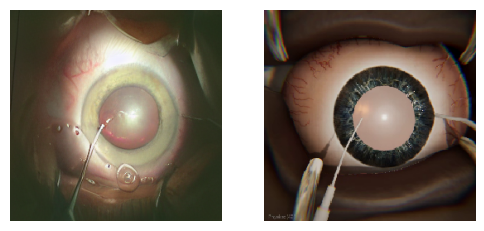

(256, 256, 3) uint8


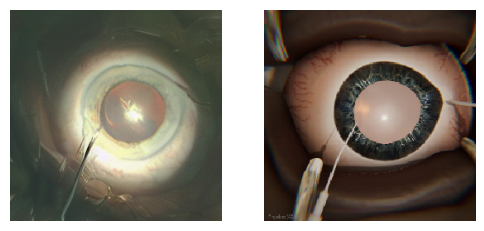

(256, 256, 3) uint8


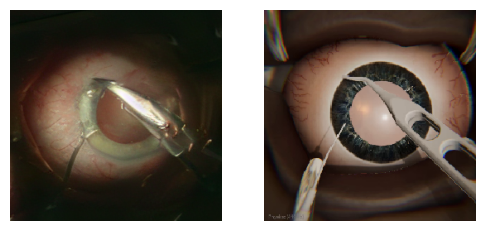

(256, 256, 3) uint8


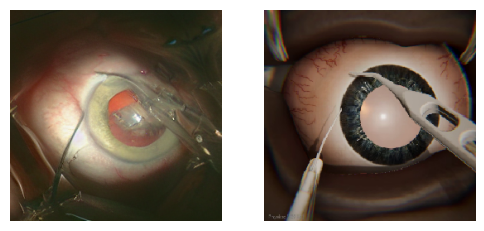

(256, 256, 3) uint8


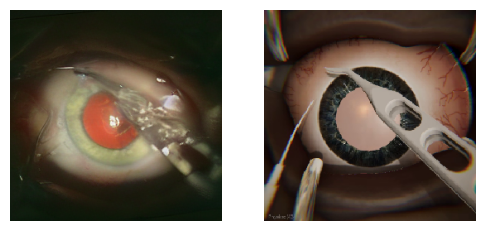

(256, 256, 3) uint8


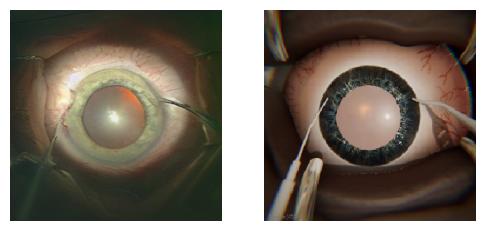

(256, 256, 3) uint8


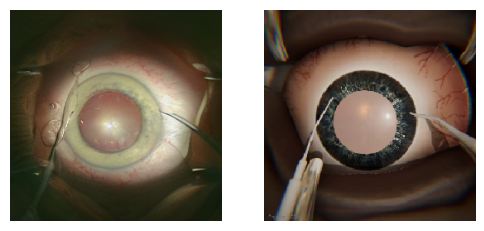

(256, 256, 3) uint8


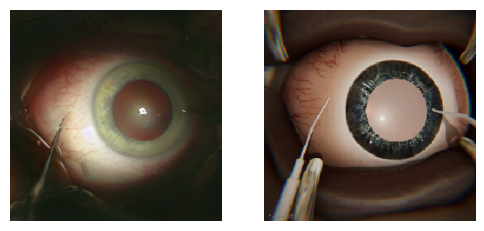

(256, 256, 3) uint8


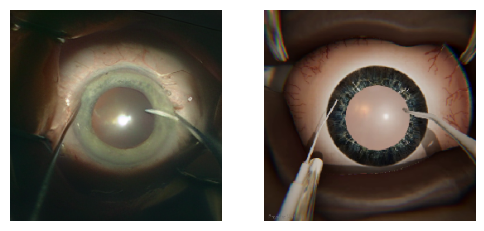

(256, 256, 3) uint8


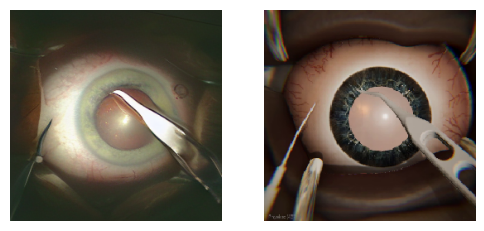

(256, 256, 3) uint8


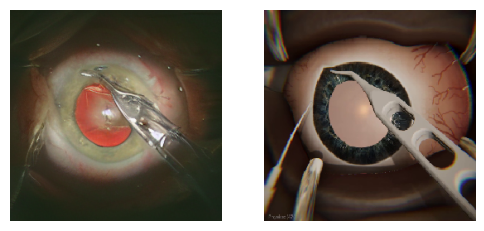

(256, 256, 3) uint8


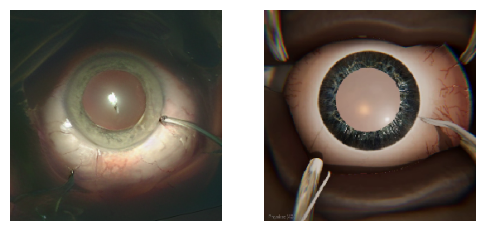

(256, 256, 3) uint8


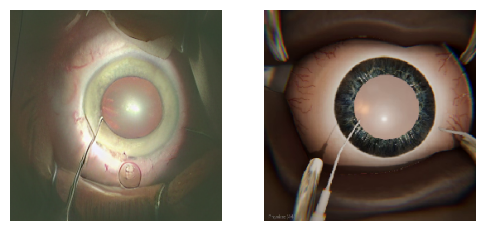

(256, 256, 3) uint8


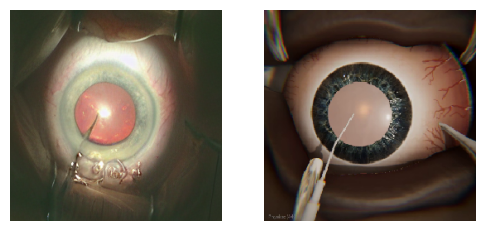

(256, 256, 3) uint8


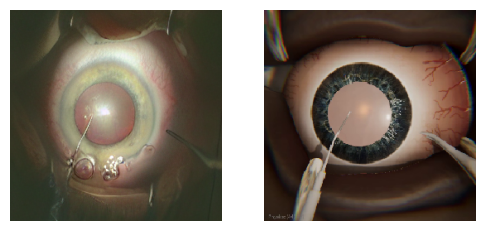

(256, 256, 3) uint8


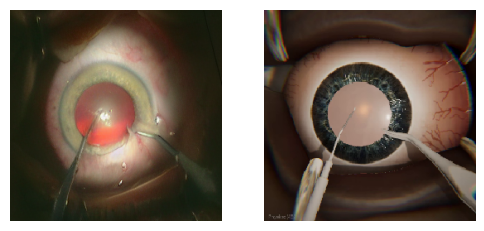

(256, 256, 3) uint8


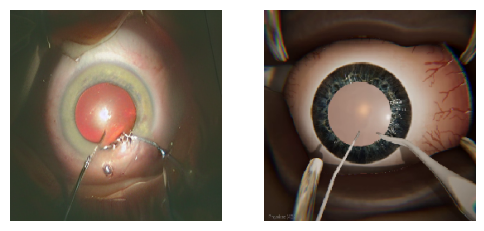

(256, 256, 3) uint8


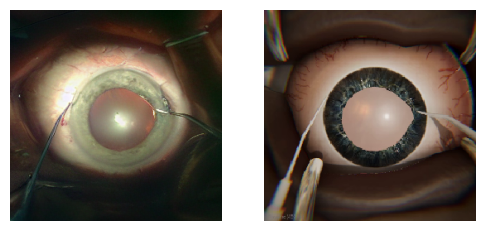

(256, 256, 3) uint8


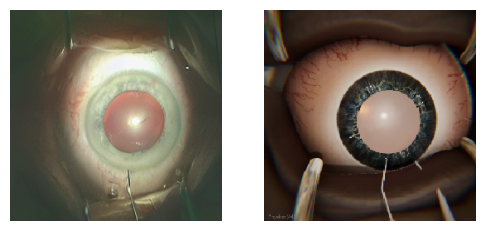

(256, 256, 3) uint8


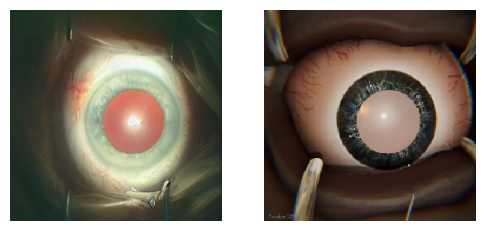

(256, 256, 3) uint8


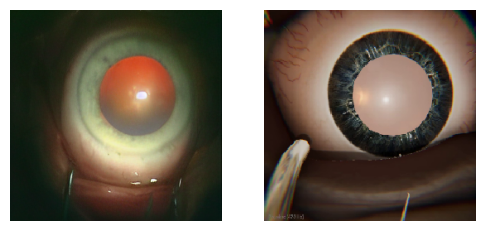

(256, 256, 3) uint8


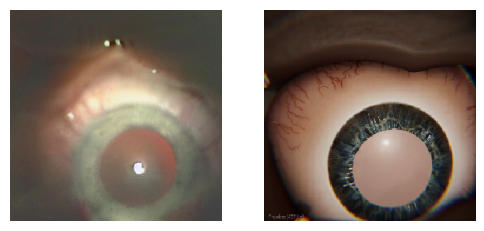

(256, 256, 3) uint8


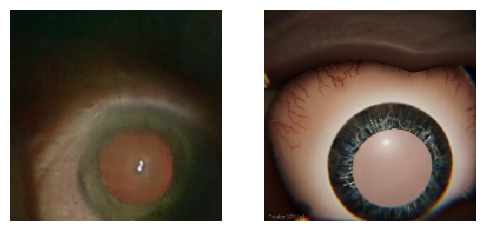

(256, 256, 3) uint8


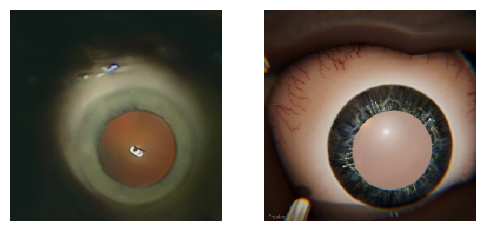

(256, 256, 3) uint8


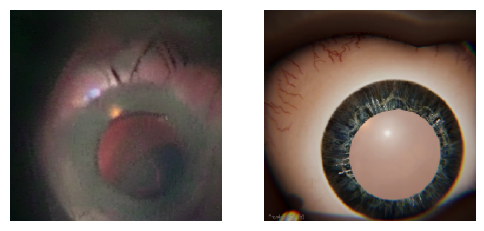

(256, 256, 3) uint8


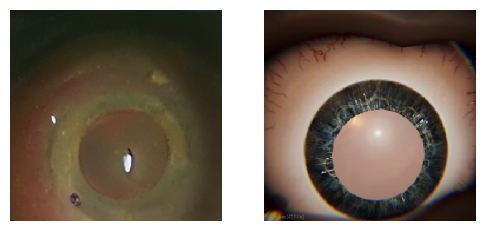

(256, 256, 3) uint8


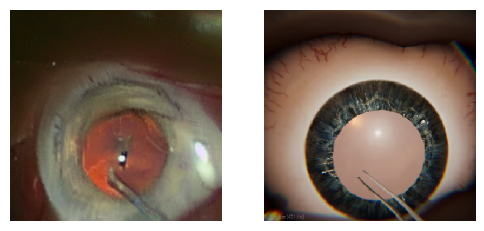

(256, 256, 3) uint8


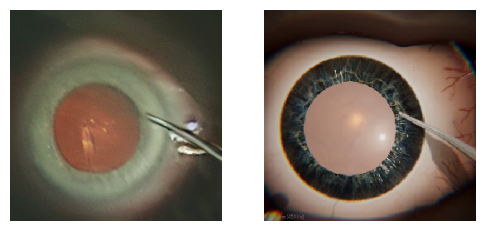

(256, 256, 3) uint8


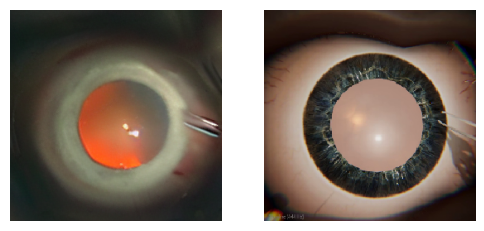

(256, 256, 3) uint8


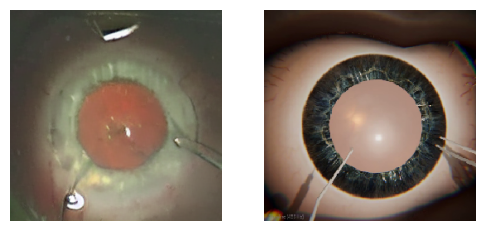

(256, 256, 3) uint8


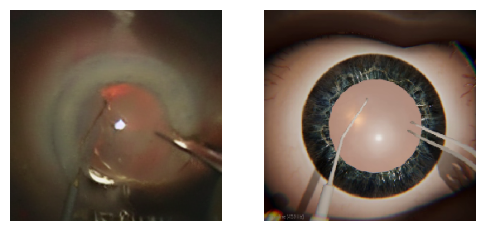

(256, 256, 3) uint8


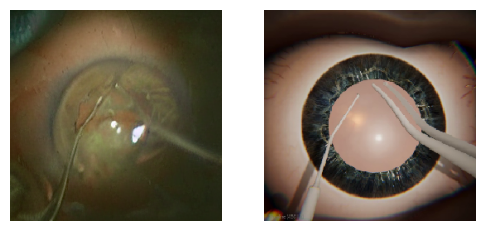

(256, 256, 3) uint8


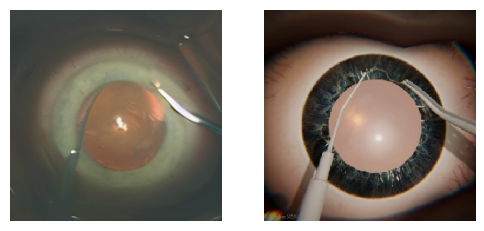

(256, 256, 3) uint8


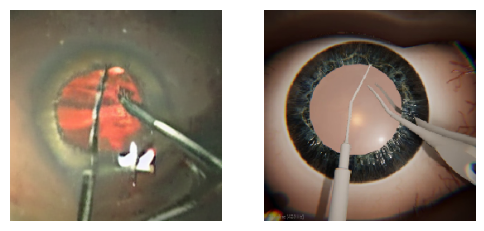

(256, 256, 3) uint8


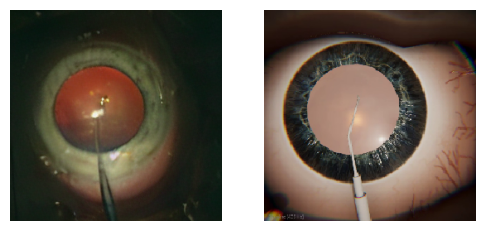

(256, 256, 3) uint8


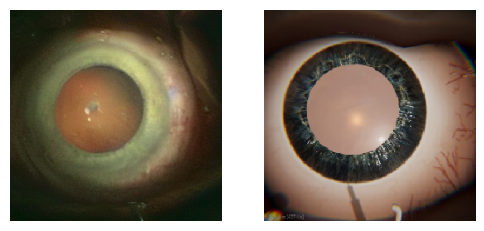

(256, 256, 3) uint8


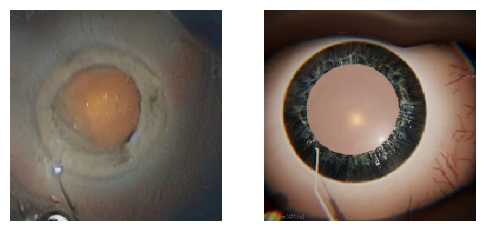

(256, 256, 3) uint8


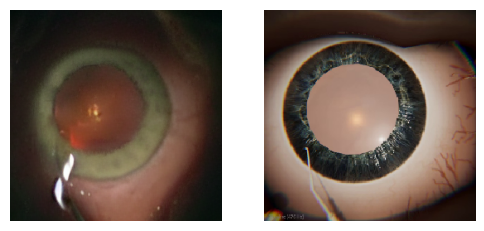

(256, 256, 3) uint8


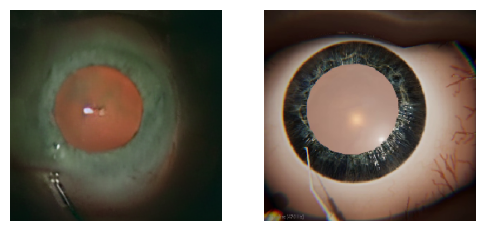

In [7]:
def visualize_two_sets(set1, set2):


    for img1, img2 in zip(set1, set2):

        print(img2.shape, img2.dtype)

        plt.figure(figsize=(6, 3))
        plt.subplot(121)
        plt.imshow((img1/255.0).astype(np.float32))
        plt.axis("off")

        plt.subplot(122)
        plt.imshow(img2)
        plt.axis("off")

        plt.show()

visualize_two_sets(diff_results_set , sim_images_set)

In [70]:

def evaluate_metrics(gt_images, diff_results_images

):

    fid_images = np.asarray(gt_images)
    fid_org_images = np.asarray(diff_results_images)

    print("============")
    print(fid_images.shape, fid_org_images.shape)

    if fid_org_images.shape[0] > fid_images.shape[0]:
        fid_org_images = fid_org_images[fid_images.shape[0]:,...]


    if fid_images.shape[3] == 3:
        fid_images = fid_images.transpose(0,-1,1,2)

    if fid_org_images.shape[3] == 3:
        fid_org_images = fid_org_images.transpose(0,-1,1,2)

    print("============")
    print(fid_images.shape, fid_org_images.shape)


    # fid = FrechetInceptionDistance(feature=64, normalize = True)
    # fid.update(torch.tensor(fid_org_images), real=True)
    # fid.update(torch.tensor(fid_images), real=False)
    # fid_value = fid.compute()
    # print("fid_value ", fid_value)

    fid = FrechetInceptionDistance(feature=2048, normalize = True)
    fid.update(torch.tensor(fid_org_images), real=True)
    fid.update(torch.tensor(fid_images), real=False)
    fid_value = fid.compute()
    print("fid_value ", fid_value)





    kid = KernelInceptionDistance(subset_size=8, normalize = True)
    kid.update(torch.tensor(fid_org_images), real=True)
    kid.update(torch.tensor(fid_images), real=False)
    kid_value = kid.compute()
    print("kid_value ", kid_value)



    # print(f"\n✅ DONE — {num_samples} images saved in: {output_dir}")


    return fid_value, kid_value

# r2
# fid_value  tensor(299.5257)
# kid_value  (tensor(0.2796), tensor(0.0329))
# LPSIS np.float64(0.6526013639435839)


# r3
# fid_value  tensor(306.9725)
# kid_value  (tensor(0.2672), tensor(0.0332))
# np.float64(0.6650590394224439)


In [128]:
fid_value_output, kid_value_output = evaluate_metrics(diff_results_set , gt_images_set)

(70, 256, 256, 3) (169, 256, 256, 3)
(70, 3, 256, 256) (99, 3, 256, 256)
fid_value  tensor(306.9725)
kid_value  (tensor(0.2672), tensor(0.0332))


In [91]:
sim_images_set.shape

(134, 600, 600, 3)

In [129]:
#lpsis

lpsis_list = []


for img1, img2 in zip(sim_images_set, diff_results_set):

    img_org2 = (img1/255.0).astype(np.float32)
    # print(img_org2.shape, img_org2.dtype, np.min(img_org2), np.max(img_org2))

    lpips_fn = lpips.LPIPS(net='vgg').to("cuda")
    # decoded_lp = decoded * 2 - 1
    decoded_lp = torch.Tensor(img2/255.0) * 2 - 1
    decoded_lp = decoded_lp.permute(2,0,1)
    # print(decoded_lp.shape, decoded_lp.dtype, torch.min(decoded_lp), torch.max(decoded_lp))

    gt_lp = torch.Tensor(img_org2) * 2 - 1
    gt_lp = gt_lp.permute(2,0,1)



    # print(img_org2.shape, img_org2.dtype, torch.min(gt_lp), torch.max(gt_lp))



    # print(decoded_lp.shape, decoded_lp.dtype, torch.min(decoded_lp), torch.max(decoded_lp))
    # print(gt_lp.shape, gt_lp.dtype, torch.min(gt_lp), torch.max(gt_lp))

    lpips_value = lpips_fn(decoded_lp.to("cuda"), gt_lp.to("cuda")).mean().item()
    lpsis_list.append(lpips_value)
    # lpips_value

Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]


/home/MichalMo/anaconda3/envs/diffusers/lib/python3.13/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/MichalMo/anaconda3/envs/diffusers/lib/python3.13/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /home/MichalMo/anaconda3/envs/diffusers/lib/python3.13/site-packages/lpips/weights/v0.1/vgg.pth
Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: /home/MichalMo/anaconda3/envs/diffusers/lib/python3.13/site-packages/lpips/weights/v0.1/vgg.pth
Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: /home/MichalMo/anaconda3/envs/diffusers/lib/python3.13/site-packages/lpips/weights/v0.1/vgg.pth
Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: /home/MichalMo/anaconda3/envs/diffusers/lib/python3.13/site-packages/lpips/weights/v0.1/vgg.pth
Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: /home/MichalMo/anaconda3/envs/diffusers/lib/python3.13/site-packages/lpips/weights/v0.1/vgg.pth
Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: /home/MichalMo/anaconda3/envs/diffusers/lib/p

In [130]:
np.mean(lpsis_list)

np.float64(0.6650590394224439)

(array([ 3.,  1.,  4.,  5.,  7., 13., 20.,  4.,  6.,  4.]),
 array([0.59338224, 0.60383701, 0.61429179, 0.62474656, 0.63520133,
        0.64565611, 0.65611088, 0.66656566, 0.67702043, 0.6874752 ,
        0.69792998]),
 <BarContainer object of 10 artists>)

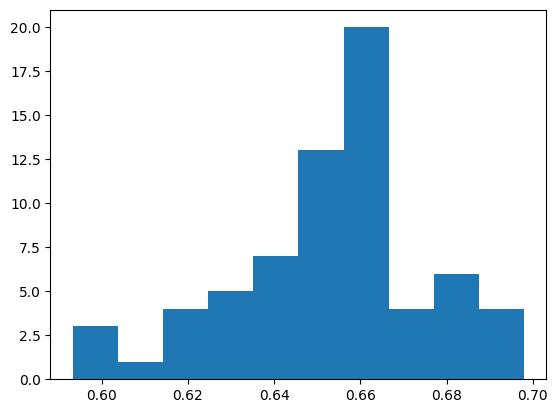

In [119]:
plt.hist(lpsis_list)

(np.float64(-0.5), np.float64(255.5), np.float64(255.5), np.float64(-0.5))

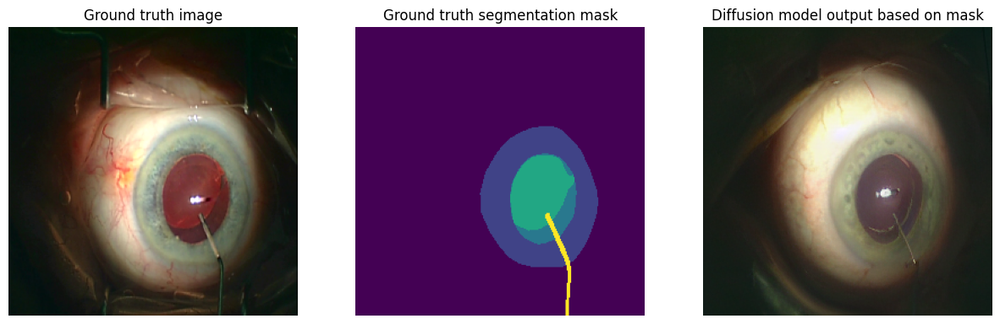

In [9]:
img1 = Image.open("results/eval_manual_cataract_fold0_3_cont1_114543_i30/sample_401_org_case_5334_case5334_72.png")
img2 = Image.open("results/eval_manual_cataract_fold0_3_cont1_114543_i30/sample_401_case_5334_case5334_72.png")
img3 = Image.open("results/eval_manual_cataract_fold0_3_cont1_114543_i30/sample_401_cond_case_5334_case5334_72.png")


plt.figure(figsize=(15,5))

plt.subplot(131)

plt.imshow(img1)
plt.title("Ground truth image")
plt.axis("off")

plt.subplot(132)


plt.imshow(img3)
plt.title("Ground truth segmentation mask")

plt.axis("off")

plt.subplot(133)
plt.imshow(img2)
plt.title("Diffusion model output based on mask")

plt.axis("off")
